# Birdseye CNN
Matrikelnr. 5504890

The goal of the project is to extract the birds-eye view (BEV) from the imagery of car cameras.
Specifically, we want to distinguish between drivable sections (roads) and non-drivable sections (houses, pavements, etc.).

In detail, a set of input images is mapped to a BEV of the situation [1], in the following image the more difficult task includes not only identifying rode segments but also objects:
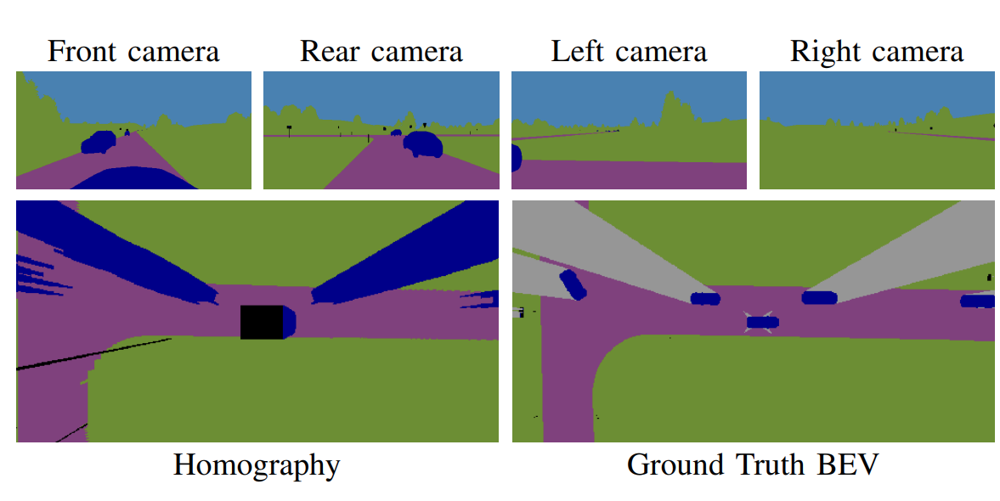
#

## Motivation
The BEV can enable self-driving cars to plan ahead, as they allow for a more accurate representation of surrounding objects.
Multiple approaches to computing the BEV exist [2]. These inlcude:
- Inverse perspective mapping. Using homography, with IPM, the surface is assumed to be planar. With knowledge of the camera angle, one can remap the situation to a BEV. Drawbacks include distortion (because an horizontal plane is assumed) and low precision for objects further away from the image, as they are represented by less pixels in the original image[3]:
  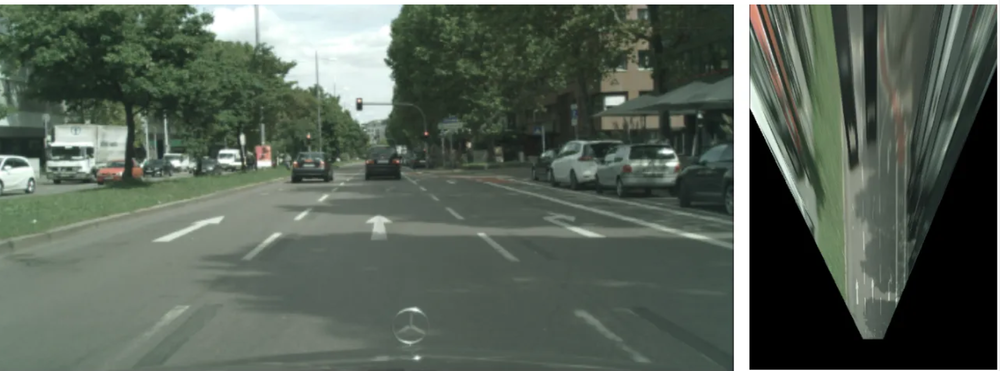

- The surrounding environment can be reconstructed by using lidar sensors.
- Vision based neural networks can be trained in conjunction with labeled BEVs.




# Methodology

- The dataset is constructed with the help of google maps and the street view feature.
- A cnn is trained to construct the birds eye view with the help of the (street-view, maps BEV) pairs.


[1] https://ieeexplore.ieee.org/document/9294462 <br>
[2] https://www.youtube.com/watch?v=TzXuwt56a0E <br>
[3] https://towardsdatascience.com/a-hands-on-application-of-homography-ipm-18d9e47c152f

## Dataset


The dataset is assembled using the standard google street view interface, in an automated manner. The basis for the groundtruth is then the graphical BEV:
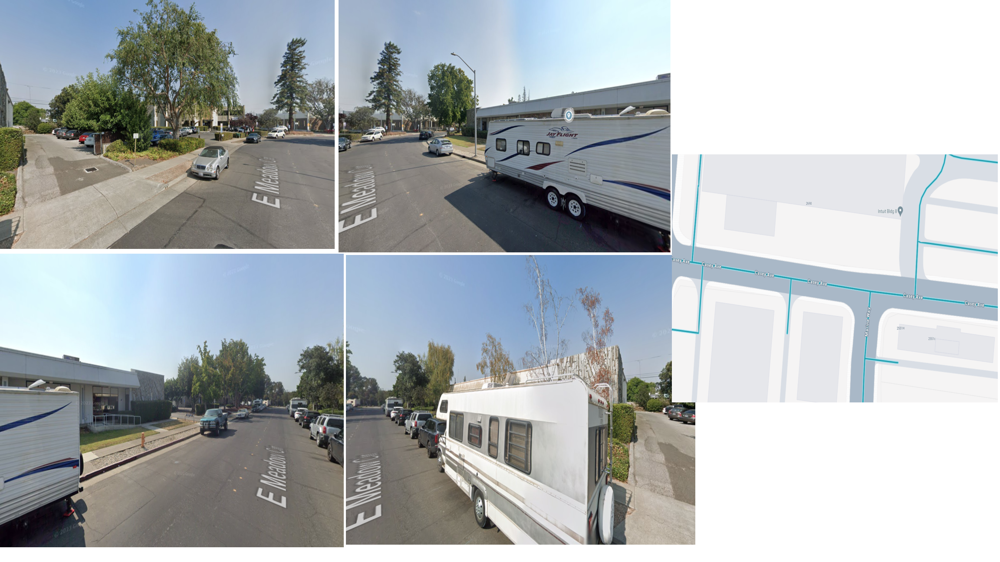

The automation of obtaining the datset from google maps proved rather difficult, and different methods were explored (including using open-cv to determine road angles).
It is settled on an implementation which is unaware of the possible driving direction (It is non-trivial to determine which way the road faces from the input given). So the street-view images are taken in North, East, South and West direction, with the BEV having the correct orientation.
The extraction code can be found here: https://github.com/AmosDinh/CNNbirdseye/blob/main/maps_builder.py

Given the BEV, the target map is extracted, which represents the possible driving/walking area:

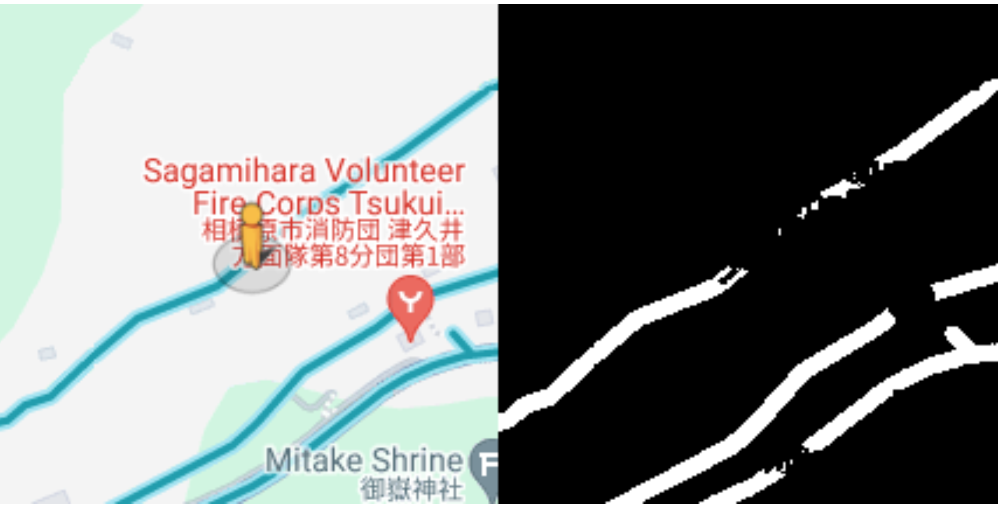

One problem is that road segments are not connected correctly, since text or symbols occlude the road sometimes. 
Again it is settled on leaving the target BEV as is. 
Following methods achieved no success (due to time and computing limitations):
- open-cv based 
- training a CNN (ResNet, UNet) on generated data: Data conists of curved and non-curved white lines on black background, representing the roads, parts of the image are occluded with black noise, the CNN is trained to reconstruct the noisy parts. The task requires the model to understand when road-segments should be connected (many examples are not as trivial as the image above). Below is an example training pair: 
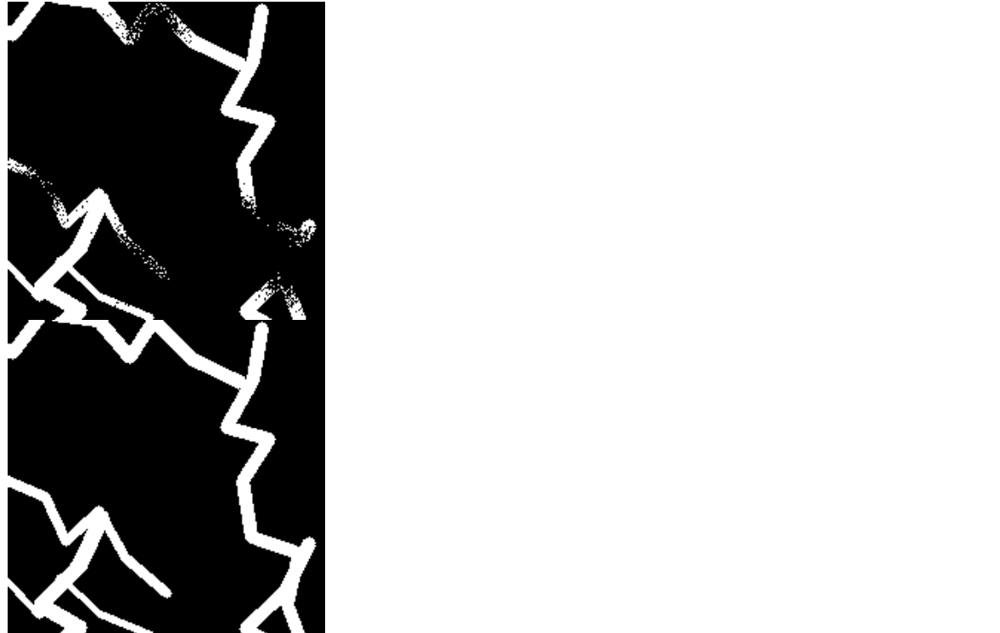


## Used Network

As CNN a Deeplab-V3 plus is used [4]. The network is pretrained on image segmentation tasks and serves as baseline [3] compare their model against.

It incorporates atrous convolution to preserve detail in later layers while still being able to condense the visual information[5]:
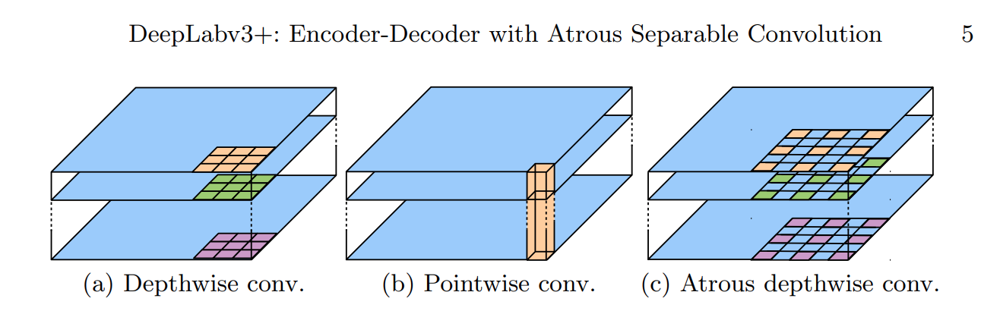

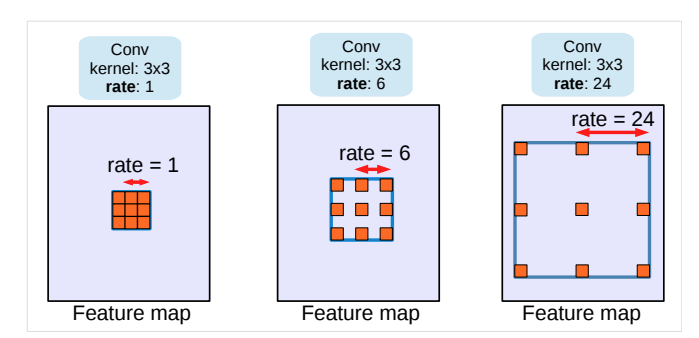
[6]

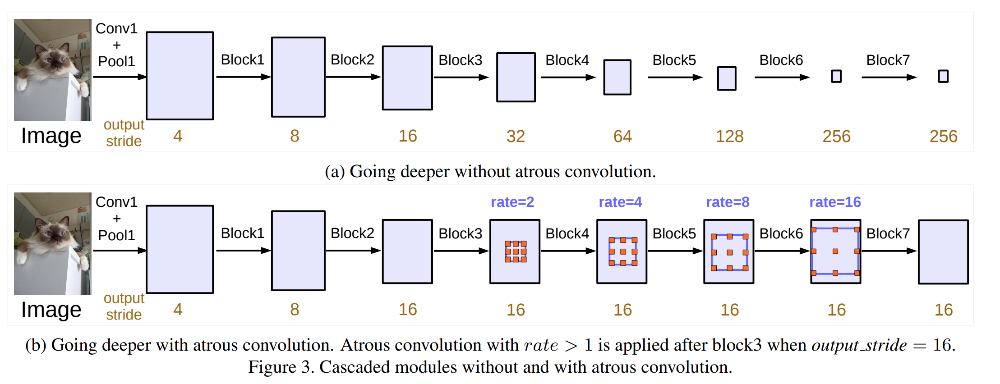
[6]
<br><br>
[4] https://github.com/jfzhang95/pytorch-deeplab-xception?tab=readme-ov-file<br>
[5] https://arxiv.org/abs/1802.02611<br>
[6] https://arxiv.org/abs/1706.05587

In [1]:

import cv2
import numpy as np

def get_minimap(img):
    x, y, width, height = 24, 482, 214, 214
    minimap = img[y:y + height, x:x + width]
    return minimap

def trace_walkable_sections(image_path):
    # Read the image
    img = cv2.imread(image_path)
    img = get_minimap(img)
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for blue color (you may need to adjust these values)
    lower_blue = np.array([76, 49, 168])
    upper_blue = np.array([98, 246, 247])

    # Thresholding to get binary image
    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    

    # Optional: Apply morphological operations for noise reduction
    #kernel = np.ones((5, 5), np.uint8)
    #mask = cv2.erode(mask, kernel, iterations=1)
    #mask = cv2.dilate(mask, kernel, iterations=1)

    # Find contours
    #contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on a blank image
    #result = np.zeros_like(img)
    result = cv2.bitwise_and(img, img, mask=mask)
    result[np.where((result != [0,0,0]).all(axis = 2))] = [255,255,255]
    gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)


    
    # side_by_side = np.hstack((img, gray))
    cv2.imshow("Side by Side", gray)
    
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
trace_walkable_sections('google_maps2.png')

In [1]:
# Model, there is a pretrained model available 
# https://pytorch.org/vision/stable/models/generated/torchvision.models.segmentation.deeplabv3_resnet50.html#torchvision.models.segmentation.deeplabv3_resnet50


import torch
import torchvision
from torchvision import transforms
from PIL import Image

# deeplabv3_resnet50

model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)

model.eval()

image_path = 'Untitled.png'
resize_size = [520]

transform = transforms.Compose([
    transforms.Resize(resize_size, interpolation=Image.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model.parameters

<bound method Module.parameters of DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inp

The Deeplab-V3 model has the "DeepLabHead" on top of the ResNet, as shown in the model parameters above.
The head contains the atrous spatial pyramid pooling [7]: 
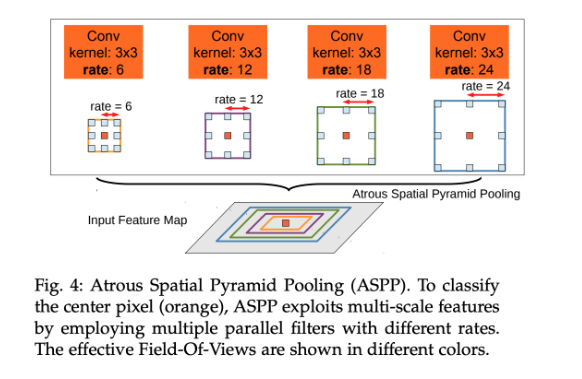

[7] https://arxiv.org/pdf/1606.00915v2.pdf

Since we want to include all four images of the street-view, the forwardpass is executed on each image separately until layer 4. In layer 4 the feature maps of all four image representations are stacked. One rescale layer between layer 3 and layer 4 is added such that the 1024*4 channels of the four images are reduced to 1024 feature maps, such that they fit into the layer 4's 1024 kernels.

For training, we unfreeze starting layer 3.

In [2]:
import torch 
import torch.nn.functional as F

class Model(torch.nn.Module):
    def __init__(self, deeplabv3) -> None:
        super().__init__()
        self.resnet = deeplabv3
       
        for param in self.resnet.parameters():
            param.requires_grad = False
            
        
        self.pretrained_separate1 = torch.nn.Sequential(
            self.resnet.backbone.conv1,
            self.resnet.backbone.bn1,
            self.resnet.backbone.relu,
            self.resnet.backbone.maxpool,
            self.resnet.backbone.layer1,
            self.resnet.backbone.layer2
        )
        self.pretrained_separate_unfrezee = self.resnet.backbone.layer3
        
        self.rescale_1 = torch.nn.Sequential(
            torch.nn.Conv2d(4096, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False),
            torch.nn.BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            torch.nn.Conv2d(2048, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False),
            torch.nn.BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        ) # reduce the channels of all four images so it fits into layer 4
        
        self.pretrained_joined_unfreeze = torch.nn.Sequential(
            self.resnet.backbone.layer4,
            self.resnet.classifier[0],
            self.resnet.classifier[1],
            self.resnet.classifier[2],
            self.resnet.classifier[3],
            torch.nn.Conv2d(256, 2, kernel_size=(1, 1), stride=(1, 1)) # road or no road
        )
        
        # self.pretrained_classifier = torch.nn.Sequential( # final head
        #     torch.nn.Conv2d(1024, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
        #     torch.nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
        #     torch.nn.ReLU(inplace=True),
        #     torch.nn.Dropout(p=0.1, inplace=False),
        #     torch.nn.Conv2d(256, 21, kernel_size=(1, 1), stride=(1, 1))
        # )
        
        for param in self.pretrained_separate_unfrezee.parameters():
            param.requires_grad = True
        for param in self.pretrained_joined_unfreeze.parameters():
            param.requires_grad = True
        
    
    def forward(self, imgs):
        results = []
        n_imgs = imgs.shape[0]
        for i in range(n_imgs):
            x = self.pretrained_separate1(imgs[i])
            x = self.pretrained_separate_unfrezee(x)
            results.append(x)
        
        # concatenate along channel axis
        x = torch.cat(results, dim=1) # channel dim
        print(x.shape)
        x = self.rescale_1(x) # reduce the channels of all four images so it fits into layer 4
        print(x.shape)
        x = self.pretrained_joined_unfreeze(x)
        #x = self.pretrained_classifier(x)
        return x
        

deeplabv3 = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
model = Model(deeplabv3)

model_input = transform(Image.open(image_path).convert('RGB')).unsqueeze(0)

model_input = torch.cat([model_input, model_input], dim=0).unsqueeze(0)
model_inputs = torch.cat([model_input, model_input, model_input, model_input], dim=0)
model.cuda()
model_outputs = model(model_inputs.cuda())

torch.Size([2, 4096, 65, 114])
torch.Size([2, 1024, 65, 114])


In [5]:
transform(Image.open(image_path).convert('RGB')).shape

torch.Size([3, 520, 911])

In [7]:
911/114

7.991228070175438

In [6]:
520/65

8.0

In [4]:
model_outputs.shape

torch.Size([2, 2, 65, 114])

In [ ]:
model_input.shape

torch.Size([1, 3, 520, 911])

In [ ]:
deeplabv3(model_input)['out'].shape

ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 256, 1, 1])

In [ ]:
deeplabv3

ValueError: Expected more than 1 value per channel when training, got input size torch.Size([1, 256, 1, 1])

In [ ]:
model_input.shape

torch.Size([1, 3, 520, 911])

In [ ]:
model_output = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)(torch.cat([model_input, model_input], dim=0))

/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/amos/mambaforge/envs/bev/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


: 

In [ ]:
model_input.shape

torch.Size([1, 3, 520, 924])

In [ ]:
model_output.shape

torch.Size([1, 21, 520, 924])

In [ ]:
model_input.shape, model_output.shape

(torch.Size([1, 3, 520, 911]), torch.Size([1, 21, 520, 911]))

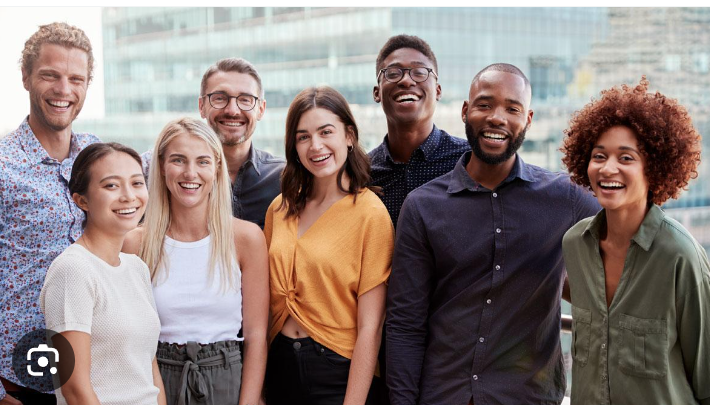

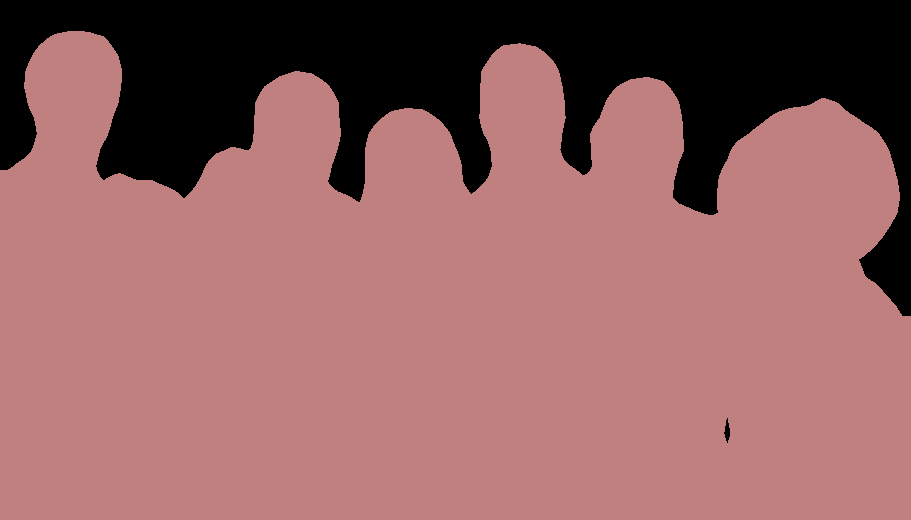

In [ ]:
output_predictions = model_output[0].argmax(0)
colormap = [
    (0, 0, 0),      # Background (Black)
    (128, 0, 0),    # Aeroplane (Maroon)
    (0, 128, 0),    # Bicycle (Green)
    (128, 128, 0),  # Bird (Olive)
    (0, 0, 128),    # Boat (Navy)
    (128, 0, 128),  # Bottle (Purple)
    (0, 128, 128),  # Bus (Teal)
    (128, 128, 128),# Car (Gray)
    (64, 0, 0),     # Cat (Brown)
    (192, 0, 0),    # Chair (Red)
    (64, 128, 0),   # Cow (Olive Green)
    (192, 128, 0),  # Dining table (Orange)
    (64, 0, 128),   # Dog (Purple)
    (192, 0, 128),  # Horse (Magenta)
    (64, 128, 128), # Motorbike (Teal)
    (192, 128, 128),# Person (Light Gray)
    (0, 64, 0),     # Potted plant (Dark Green)
    (128, 64, 0),   # Sheep (Dark Olive Green)
    (0, 192, 0),    # Sofa (Light Green)
    (128, 192, 0),  # Train (Light Olive)
    (0, 64, 128)    # TV/Monitor (Dark Teal)
]

# Convert class indices to RGB values
output_colored = torch.zeros(3, output_predictions.shape[0], output_predictions.shape[1], dtype=torch.uint8)
for i in range(len(colormap)):
    mask = output_predictions == i
    output_colored[0, mask] = colormap[i][0]
    output_colored[1, mask] = colormap[i][1]
    output_colored[2, mask] = colormap[i][2]

# Convert to a PIL image for visualization
output_image = transforms.ToPILImage()(output_colored)

# Display the input image and the segmentation mask
Image.open(image_path).convert('RGB').show()
output_image.show()

# Alternatively, save the visualization
#output_image.save('output_visualization.png')

In [ ]:
output_colored.shape

torch.Size([3, 21, 520])